# ML Project for STP

# IMPORTING MODULES

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os as os
import pickle
warnings.filterwarnings('ignore')
from  sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, recall_score, confusion_matrix, precision_score, accuracy_score, \
mean_absolute_error, mean_squared_error, root_mean_squared_error
from sklearn.datasets import load_iris,load_breast_cancer,load_wine
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
print('All Modules Loaded Successfully!!')

All Modules Loaded Successfully!!


# Step 2: Load Dataset

## Wine, Iris, Cancer and Mobile

In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("shreyakatukuri/tennis")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\Nishant\.cache\kagglehub\datasets\shreyakatukuri\tennis\versions\1


In [5]:
file_name = os.listdir(path)[0]

file_path = path + '\\' + file_name

df_tennis = pd.read_csv(file_path)

In [6]:
iris = load_iris()
wine = load_wine()
breast_cancer = load_breast_cancer()

In [7]:
breast_cancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [8]:
breast_cancer_df = pd.DataFrame(breast_cancer['data'],columns=breast_cancer['feature_names'])
breast_cancer_df['target'] = breast_cancer['target']
breast_cancer_target_names = breast_cancer['target_names']
print(breast_cancer_target_names)

['malignant' 'benign']


In [9]:
breast_cancer_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


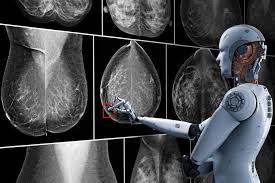

In [10]:
iris_df = pd.DataFrame(iris['data'],columns=iris['feature_names'])
iris_df['target'] = iris['target']
iris_target_names = iris['target_names']
print(iris_target_names)

['setosa' 'versicolor' 'virginica']


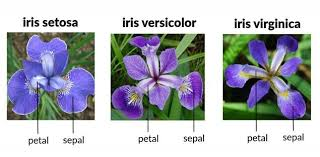

In [11]:
wine_df = pd.DataFrame(wine['data'],columns=wine['feature_names'])
wine_df['target'] = wine['target']
wine_target_names = wine['target_names']
print(wine_target_names)

['class_0' 'class_1' 'class_2']


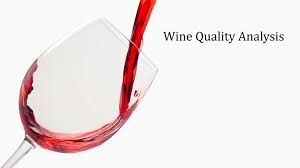

In [12]:
df_tennis

,outlook,temp,humidity,windy,play
0,sunny,hot,high,False,no
1,sunny,hot,high,True,no
2,overcast,hot,high,False,yes
3,rainy,mild,high,False,yes
4,rainy,cool,normal,False,yes
5,rainy,cool,normal,True,no
6,overcast,cool,normal,True,yes
7,sunny,mild,high,False,no
8,sunny,cool,normal,False,yes
9,rainy,mild,normal,False,yes


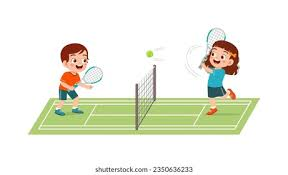

# step: 3 EDA

In [13]:
iris_df.describe()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
count,150.000000,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333,1.000000
std,0.828066,0.435866,1.765298,0.762238,0.819232
min,4.300000,2.000000,1.000000,0.100000,0.000000
25%,5.100000,2.800000,1.600000,0.300000,0.000000
50%,5.800000,3.000000,4.350000,1.300000,1.000000
75%,6.400000,3.300000,5.100000,1.800000,2.000000
max,7.900000,4.400000,6.900000,2.500000,2.000000


In [14]:
wine_df.describe()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258,0.938202
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474,0.775035
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000,0.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000,0.000000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000,1.000000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000,2.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000,2.000000


In [15]:
col = breast_cancer_df.columns       
print(col)

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension',
       'target'],
      dtype='object')


In [16]:
drop_list1 =['radius error', 'texture error', 'perimeter error', 'area error',
 'smoothness error', 'compactness error', 'concavity error',
 'concave points error', 'symmetry error', 'fractal dimension error','mean perimeter','worst perimeter']

breast_cancer_df = breast_cancer_df.drop(drop_list1,axis = 1 ) 
breast_cancer_df.columns

Index(['mean radius', 'mean texture', 'mean area', 'mean smoothness',
       'mean compactness', 'mean concavity', 'mean concave points',
       'mean symmetry', 'mean fractal dimension', 'worst radius',
       'worst texture', 'worst area', 'worst smoothness', 'worst compactness',
       'worst concavity', 'worst concave points', 'worst symmetry',
       'worst fractal dimension', 'target'],
      dtype='object')

In [17]:
breast_cancer_df.describe()

,mean radius,mean texture,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,worst radius,worst texture,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,16.269190,25.677223,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,4.833242,6.146258,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,7.930000,12.020000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,13.010000,21.080000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,14.970000,25.410000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,18.790000,29.720000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,36.040000,49.540000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [18]:
df_tennis.describe()

,outlook,temp,humidity,windy,play
count,14,14,14,14,14
unique,3,3,2,2,2
top,sunny,mild,high,False,yes
freq,5,6,7,8,9


#### Step 3.2 null values

In [19]:
iris_df.isnull().sum()

sepal length (cm)    0
sepal width (cm)     0
petal length (cm)    0
petal width (cm)     0
target               0
dtype: int64

In [20]:
wine_df.isnull().sum()

alcohol                         0
malic_acid                      0
ash                             0
alcalinity_of_ash               0
magnesium                       0
total_phenols                   0
flavanoids                      0
nonflavanoid_phenols            0
proanthocyanins                 0
color_intensity                 0
hue                             0
od280/od315_of_diluted_wines    0
proline                         0
target                          0
dtype: int64

In [21]:
breast_cancer_df.isnull().sum()

mean radius                0
mean texture               0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
worst radius               0
worst texture              0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
target                     0
dtype: int64

In [22]:
df_tennis.isnull().sum()

outlook     0
temp        0
humidity    0
windy       0
play        0
dtype: int64

 #### no null values

In [23]:
df_tennis.shape

(14, 5)

In [24]:
wine_df.shape

(178, 14)

In [25]:
breast_cancer_df.shape

(569, 19)

In [26]:
iris_df.shape

(150, 5)

# Step: 4

### Univariate analysis

#### Step 4.1: Iris

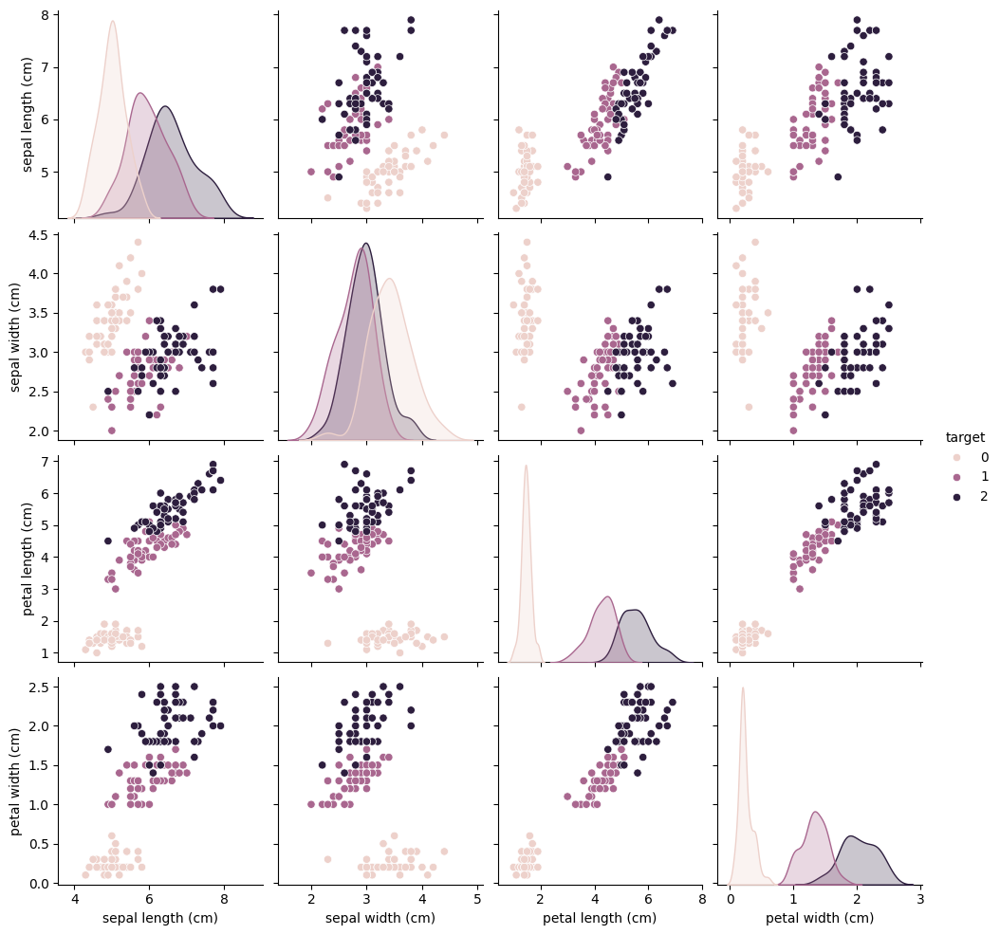

In [27]:
sns.pairplot(data = iris_df, hue = 'target')
plt.show()

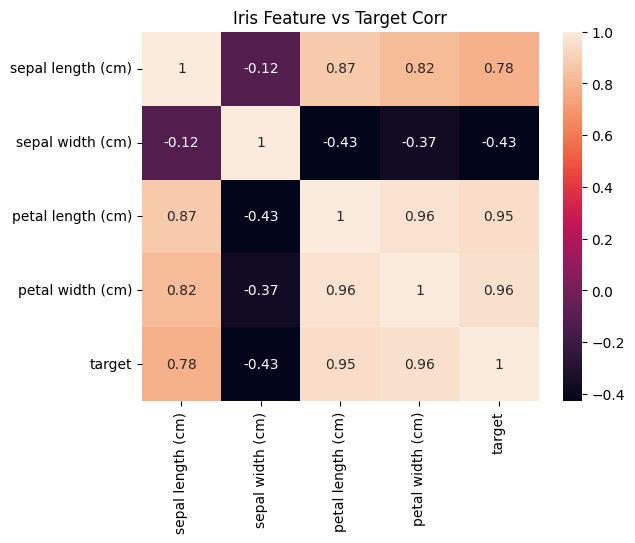

In [28]:
plt.title('Iris Feature vs Target Corr')
sns.heatmap(iris_df.corr(),annot = True)
plt.show()

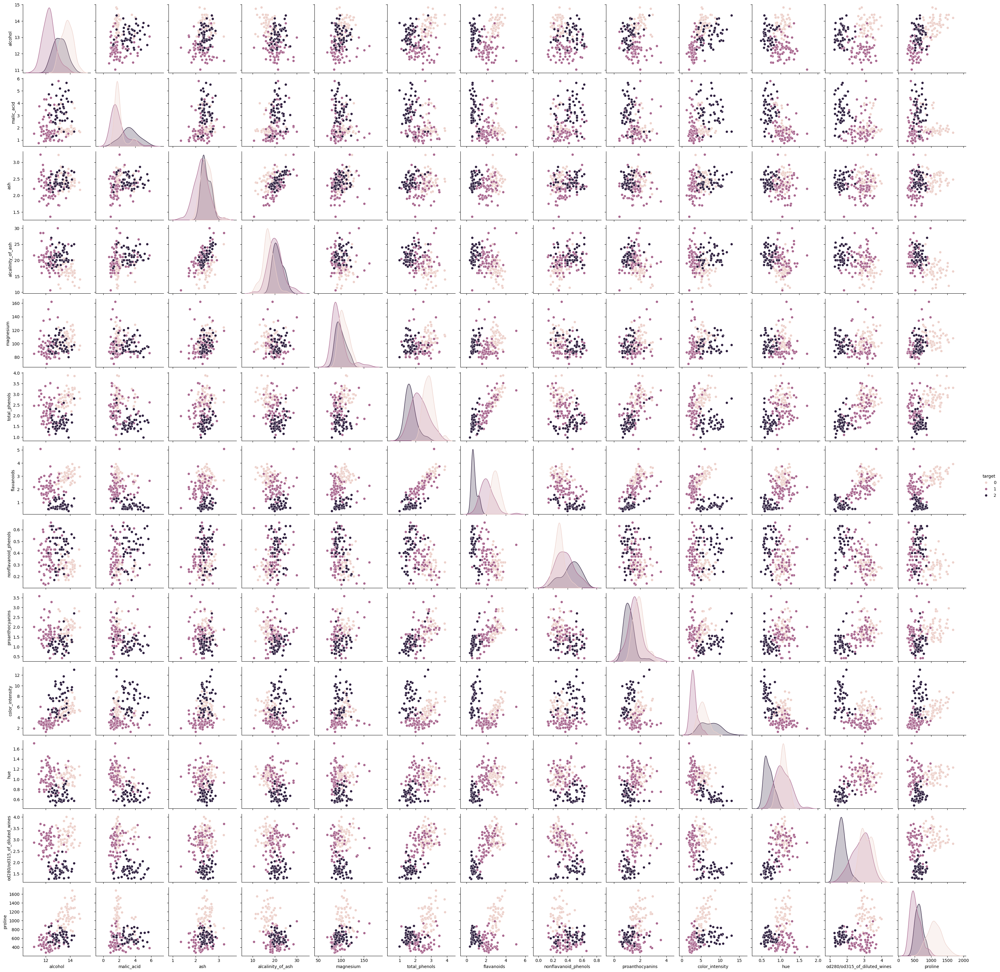

In [29]:
# sns.histplot(data = iris_df)
sns.pairplot(data = wine_df, hue = 'target')
plt.show()

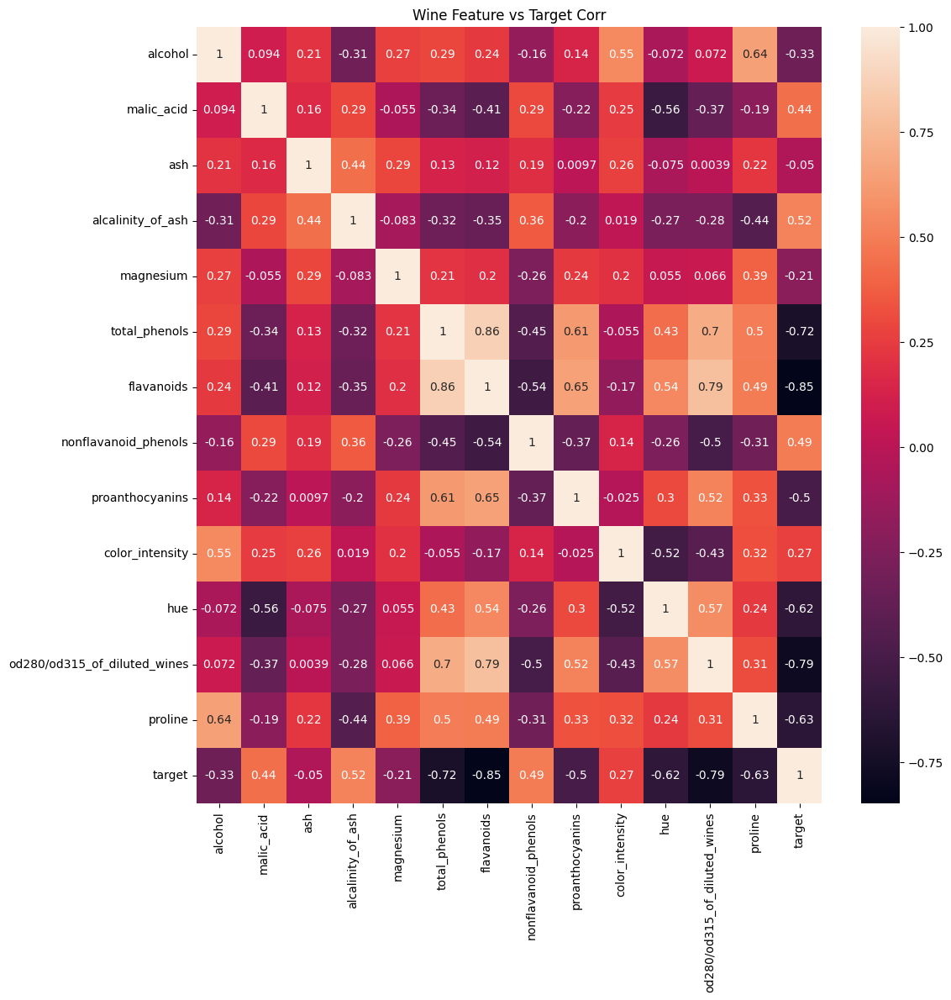

In [30]:
plt.figure(figsize=(12,12))
plt.title('Wine Feature vs Target Corr')
sns.heatmap(wine_df.corr(),annot = True)
plt.show()

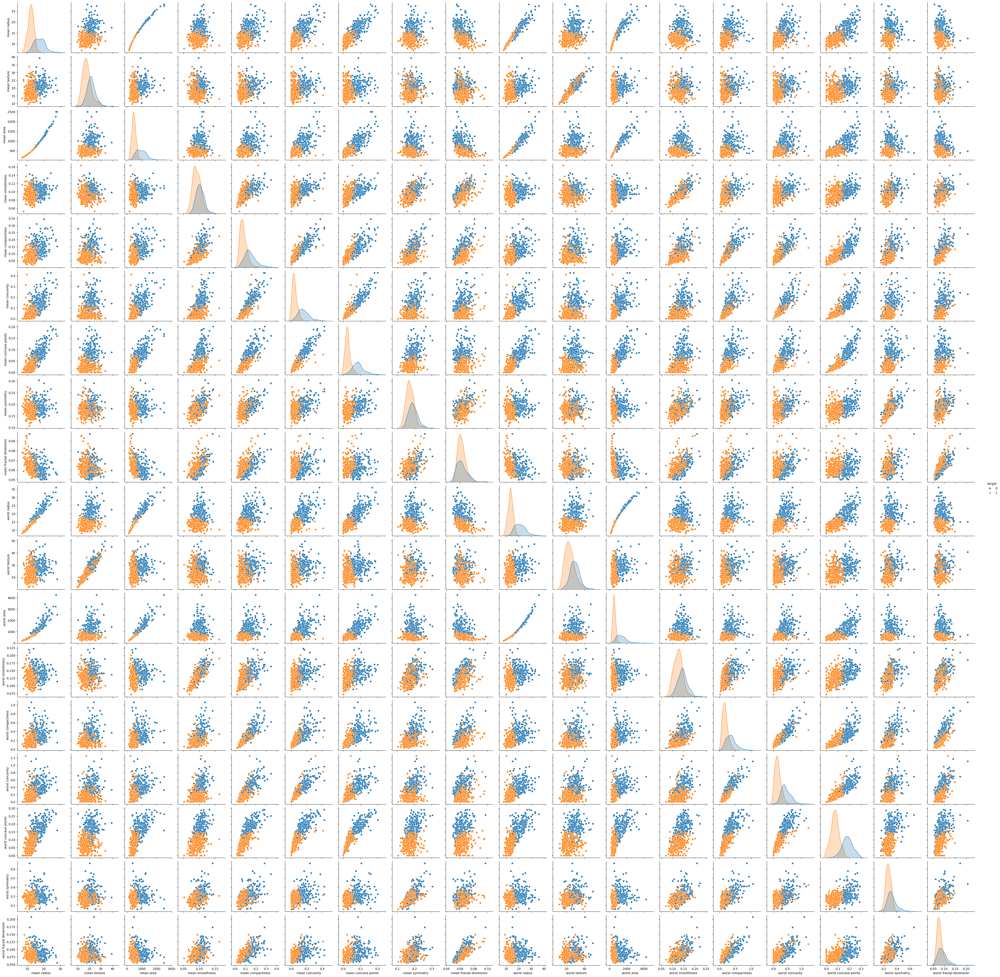

In [31]:
sns.pairplot(data = breast_cancer_df, hue = 'target')
plt.show()

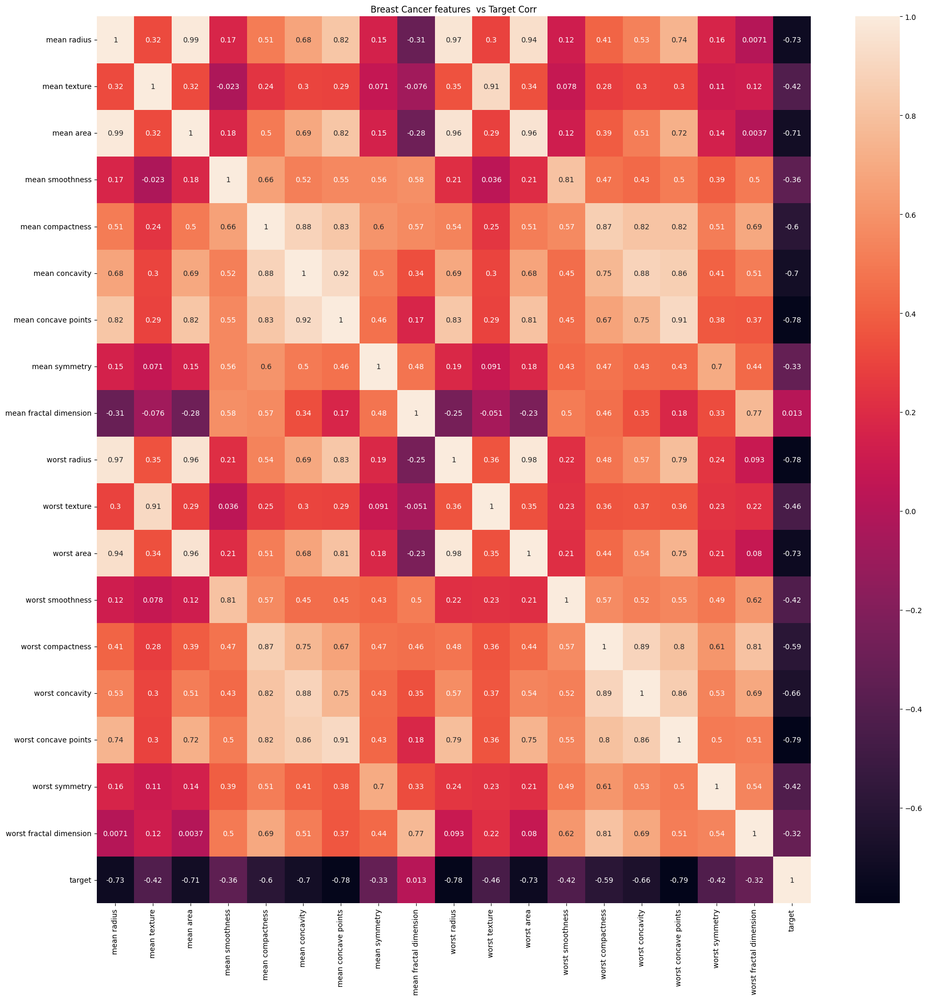

In [32]:
plt.figure(figsize=(22,22))
plt.title('Breast Cancer features  vs Target Corr')
sns.heatmap(breast_cancer_df.corr(),annot = True)
plt.show()

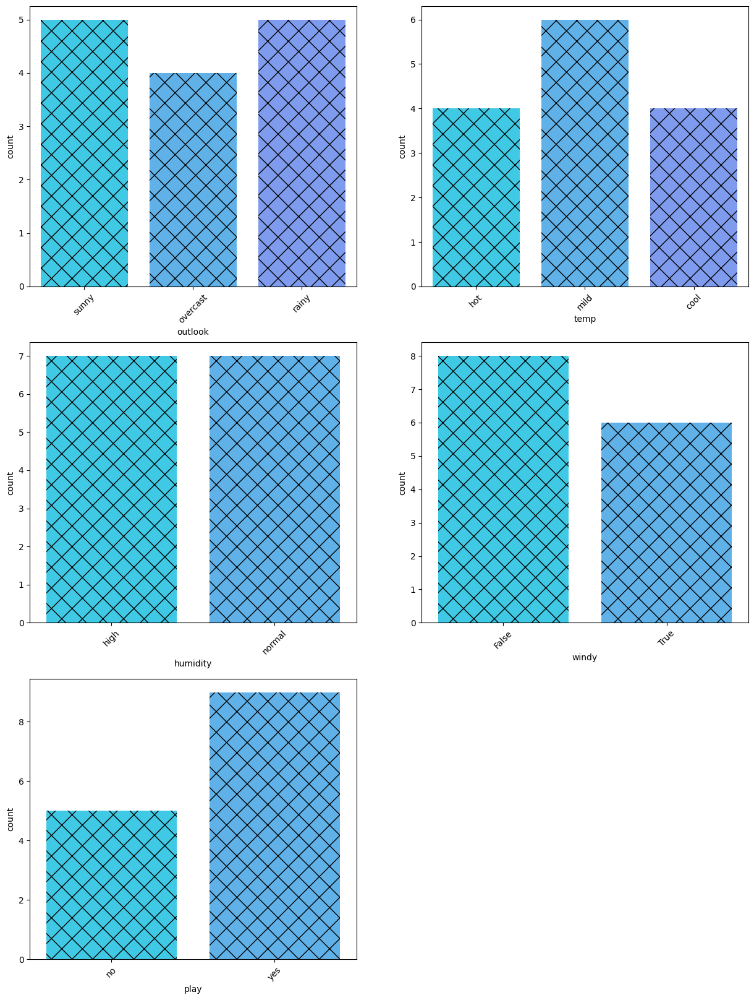

In [33]:
plt.figure(figsize=(15,20))
for i,j in enumerate(df_tennis.columns):
    plt.subplot(3,2,i+1)
    sns.countplot(data = df_tennis, x= j,palette=sns.color_palette('cool'),hatch = 'x')
    plt.xticks(rotation = 45)
plt.show()

# Step 5:Feature Engineering

### -> Text to Num

In [34]:
df_tennis_new = pd.get_dummies(df_tennis,drop_first=True,dtype = int)

In [35]:
df_tennis_new 

,windy,outlook_rainy,outlook_sunny,temp_hot,temp_mild,humidity_normal,play_yes
0,False,0,1,1,0,0,0
1,True,0,1,1,0,0,0
2,False,0,0,1,0,0,1
3,False,1,0,0,1,0,1
4,False,1,0,0,0,1,1
5,True,1,0,0,0,1,0
6,True,0,0,0,0,1,1
7,False,0,1,0,1,0,0
8,False,0,1,0,0,1,1
9,False,1,0,0,1,1,1


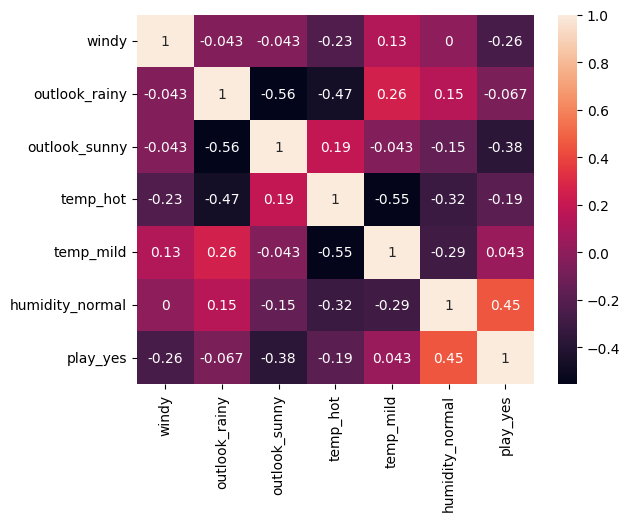

In [36]:
sns.heatmap(df_tennis_new.corr(),annot = True)
plt.show()

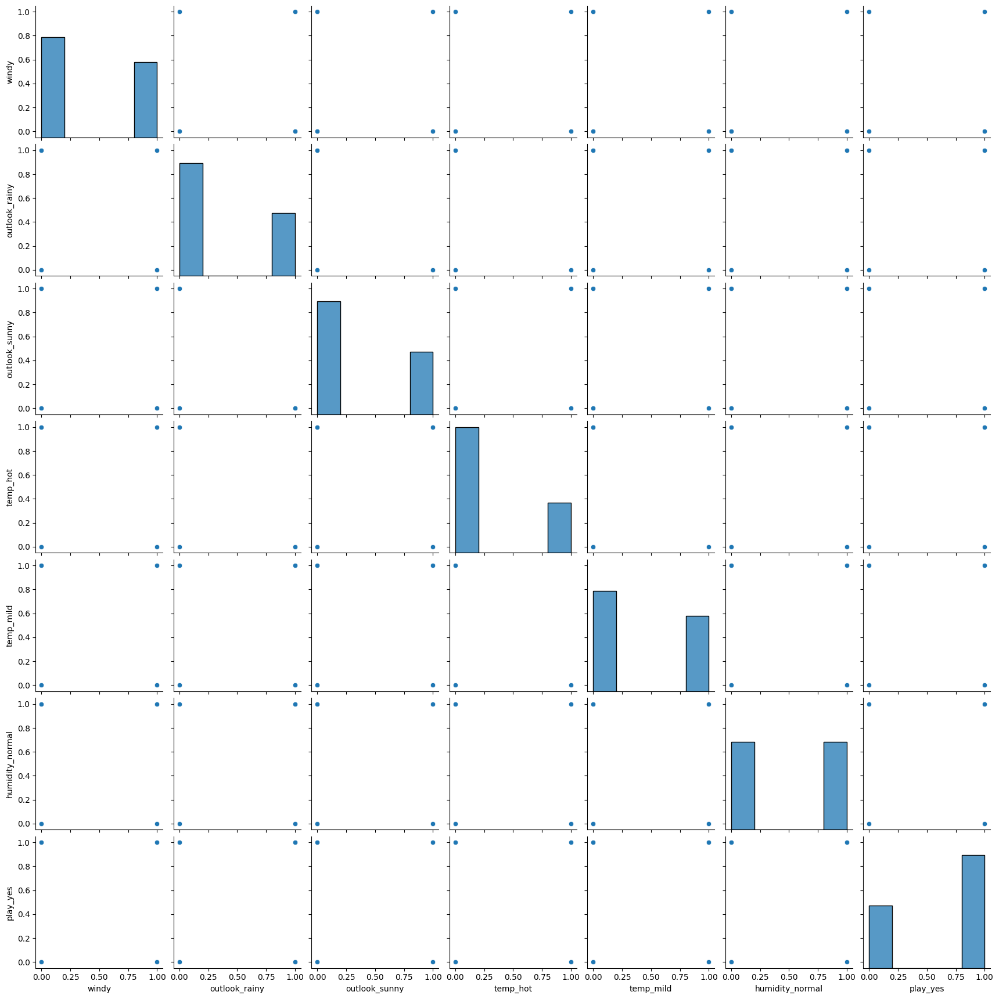

In [37]:
sns.pairplot(data =df_tennis_new)
plt.show()

# Step 6: Divide data into Feature and target, Train test Split, Model Building

In [38]:
all_df = [df_tennis_new, wine_df, iris_df  , breast_cancer_df]
all_df_name = ['df_tennis_new', 'wine_df', 'iris_df' , 'breast_cancer_df']


all_ml_model = [LogisticRegression, SVC, KNeighborsClassifier, GaussianNB, MultinomialNB, DecisionTreeClassifier, RandomForestClassifier]

all_ml_model_name = ['LogisticRegression', 'SVC', 'KNeighborsClassifier', 'GaussianNB', 'MultinomialNB', 'DecisionTreeClassifier', 'RandomForestClassifier']

temp_dict = {'Project_name':[],'ML Model Name':[],'Each Model Score':[], 'Model Brain':[]}


for j,i in enumerate(all_df):
    X = i.iloc[:,:-1]
    y = i.iloc[:,-1]

    # train test 
    X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=42, test_size=0.2)

    
    for k,ml_model in enumerate(all_ml_model):
        model = ml_model()
        model.fit(X_train,y_train)
        y_pred = model.predict(X_test)
        score = model.score(X_test,y_test)
        
        temp_dict['Project_name'].append(all_df_name[j])
        temp_dict['ML Model Name'].append(all_ml_model_name[k])
        temp_dict['Each Model Score'].append(score)
        temp_dict['Model Brain'].append(model)
all_model_matrix = pd.DataFrame(temp_dict)
all_model_matrix

,Project_name,ML Model Name,Each Model Score,Model Brain
0,df_tennis_new,LogisticRegression,0.333333,LogisticRegression()
1,df_tennis_new,SVC,0.666667,SVC()
2,df_tennis_new,KNeighborsClassifier,0.333333,KNeighborsClassifier()
3,df_tennis_new,GaussianNB,0.333333,GaussianNB()
4,df_tennis_new,MultinomialNB,0.333333,MultinomialNB()
5,df_tennis_new,DecisionTreeClassifier,0.333333,DecisionTreeClassifier()
6,df_tennis_new,RandomForestClassifier,0.333333,"(DecisionTreeClassifier(max_features='sqrt', r..."
7,wine_df,LogisticRegression,0.972222,LogisticRegression()
8,wine_df,SVC,0.805556,SVC()
9,wine_df,KNeighborsClassifier,0.722222,KNeighborsClassifier()


In [39]:
final_ml_matrix = all_model_matrix.sort_values(by = ['Project_name','Each Model Score'],ascending = False).groupby('Project_name').head(1)

In [40]:
final_ml_matrix

,Project_name,ML Model Name,Each Model Score,Model Brain
10,wine_df,GaussianNB,1.000000,GaussianNB()
14,iris_df,LogisticRegression,1.000000,LogisticRegression()
1,df_tennis_new,SVC,0.666667,SVC()
27,breast_cancer_df,RandomForestClassifier,0.964912,"(DecisionTreeClassifier(max_features='sqrt', r..."


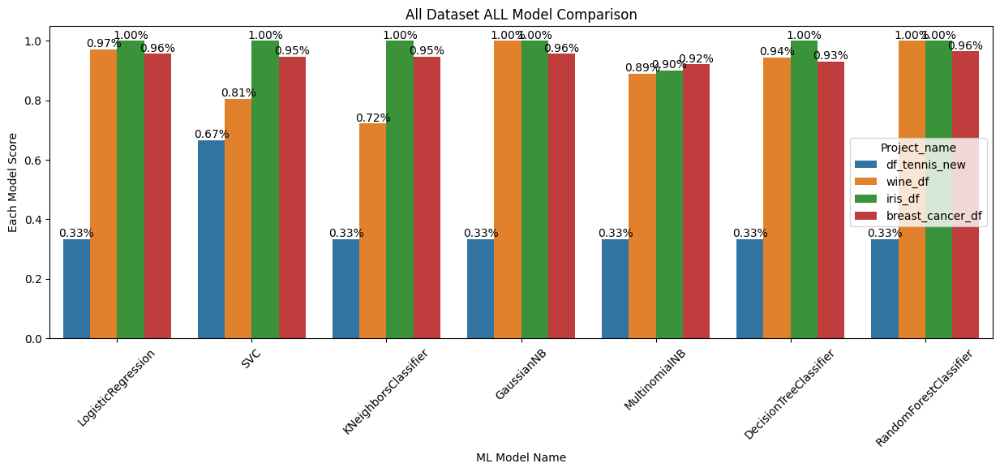

In [41]:
plt.figure(figsize=(15,5))
plt.title('All Dataset ALL Model Comparison')
ax = sns.barplot(data = all_model_matrix, x= 'ML Model Name', y = 'Each Model Score', hue = 'Project_name')
for i in ax.containers:
    plt.bar_label(i,fmt = '%.2f%%')
plt.xticks(rotation = 45)
plt.show()

# Saving Model

In [45]:
for i in final_ml_matrix[['Project_name','Model Brain']].itertuples():
    index,name,brain = tuple(i)
    cleaned_name = name.replace('df','').replace('_','').replace('new','')
    # print(cleaned_name)
    with open(f'{cleaned_name}_ml_brain.pkl','wb') as f:
        pickle.dump(brain,f)
print('Best ML Model Saved Successfully!!')

Best ML Model Saved Successfully!!


In [56]:
sample_X = df_tennis.sample().iloc[:,:-1].values
with open('tennis_ml_brain.pkl','rb') as f:
    tennis_chatgpt = pickle.load(f)

In [66]:
sample_data = iris_df.sample()
sample_X = sample_data.iloc[:,:-1]
sample_y = sample_data.iloc[:,-1]
print(sample_X.values)
print(tennis_chatgpt.predict(sample_X)[0])
# print(sample_X.values,tennis_target_names[sample_y])
# print("Model says:", tennis_target_names[iris_chatgpt.predict(sample_X)[0]])

[[5.  3.5 1.6 0.6]]


ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- petal length (cm)
- petal width (cm)
- sepal length (cm)
- sepal width (cm)
Feature names seen at fit time, yet now missing:
- humidity_normal
- outlook_rainy
- outlook_sunny
- temp_hot
- temp_mild
- ...


# Streamlit

In [48]:
os.getcwd()

'C:\\Users\\Nishant\\MlProjects'

In [49]:
import streamlit as st

In [50]:
df_tennis.to_csv('tennis',index = False)

In [51]:
wine_df.to_csv('wine',index = False)

In [54]:
breast_cancer_df.to_csv('cancer',index = False)

In [53]:
iris_df.to_csv('iris',index = False)